In [1]:
import sys
sys.path.append('../utils/')
from utils import *

# Autotune Demonstration in Python

This notebook demonstrates how to use our implementation of Autotune. 

## Pitch decomposition and Autotune

We base ourselved on one simple audio file from VocalSet:

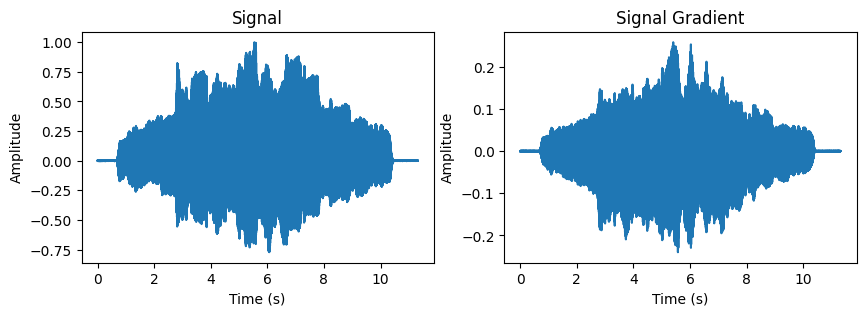

In [2]:
samplerate, signal = wavfile.read('../data/VocalSet/FULL/female1/scales/belt/f1_scales_belt_a.wav')
signal = signal/np.max(signal)
visualize_signal(signal, samplerate)
Audio(signal, rate=samplerate)

To retrieve the pitch of this audio file, we can use YIN and PYIN algorithms. We see below that PYIN is more accurate than YIN, though it is also (considerably) slower.

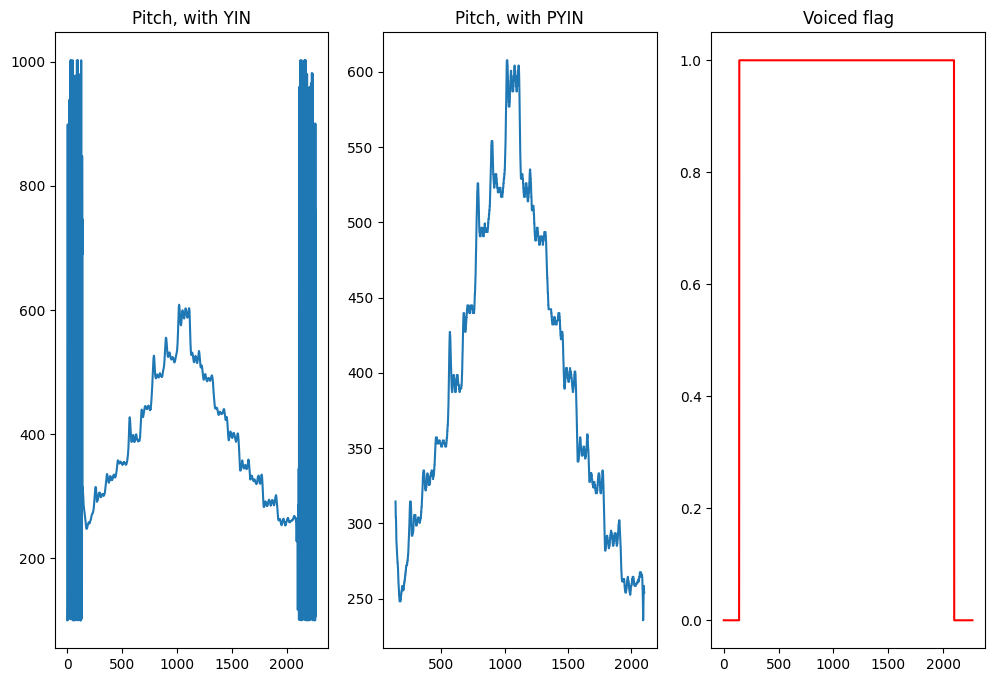

In [3]:
frame_size = int(2e-2 * samplerate) # framsize of 20ms (nearest integer)
initial_pitch = yin(signal, fmin=80, fmax=1000, sr=samplerate, frame_length=frame_size)
initial_pitch_pyin, voiced_flag, voiced_prob = pyin(signal, fmin=80, fmax=1000, sr=samplerate, frame_length=frame_size)


plt.figure(figsize=(12, 8))
plt.subplot(1, 3, 1)
plt.plot(initial_pitch)
plt.title('Pitch, with YIN')
plt.subplot(1, 3, 2)
plt.plot(initial_pitch_pyin, label='Pitch')
plt.title('Pitch, with PYIN')
plt.subplot(1, 3, 3)
plt.plot(voiced_flag, 'r', label='Voiced')
plt.title('Voiced flag')
plt.show()

Now we can shift the pitch of the audio file, we we use our implementation of Autotune. We leverage Praat to do the pitch shifting, and we use the `parselmouth` library to interact with Praat.

In [4]:
pitch_shift = -100
signal_repitched = psola_td(signal, sample_rate=samplerate, target_pitch=initial_pitch+pitch_shift)
signal_repitched = psola_td(signal, sample_rate=samplerate, target_pitch=np.ones(len(signal))*261.6)

In [5]:
Audio(signal, rate=samplerate)

In [6]:
Audio(signal_repitched, rate=samplerate)

## Automatic Tuning

To make the usage of this library a bit more handy, we have made ```utils.py``` which contains plug-and-play functions to use the library. We demonstrate how to use this library to autotune a file.

In [7]:
samplerate, signal = wavfile.read('../data/VocalSet/FULL/male10/excerpts/straight/m10_dona_straight.wav')
signal = np.array(signal, dtype=float)/np.max(signal)
Audio(signal, rate=samplerate)

In [14]:
signal_repitched = shift_full_pitch(signal, samplerate, -100)
Audio(signal_repitched, rate=samplerate)

In [16]:
target_pitch=np.ones(len(signal))*349.2
signal_constant_note = change_pitch(signal, samplerate, target_pitch)
Audio(signal_constant_note, rate=samplerate)